In [80]:
# general libs
import os
import re
import sys
import nltk 
import heapq
import string
import difflib
import sagemaker
import numpy as np 
import pandas as pd
import seaborn as sn
import awswrangler as wr
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# nltk stopwords
#nltk.download('stopwords')
from nltk.corpus import stopwords

# guara libs
from sklearn.pipeline import Pipeline
sys.path.append(os.path.dirname(os.getcwd())+'/src')
from guara.modeling.supervised_modelz import SupervisedModelz
# guara dependencies
# %pip install lightgbm
# %pip install shap
# %pip install optuna
# %pip install great_expectations

# lemmatization
from nltk.stem import WordNetLemmatizer
lemmatizer=WordNetLemmatizer()
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /home/ec2-user/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [81]:
# %pip install awswrangler
# %pip install lightgbm
# %pip install shap
# %pip install optuna
# %pip install great_expectations
# nltk.download('stopwords')

In [82]:
raw_dataset =  wr.s3.read_excel(path='s3://br-accamargo-rawdata-dev/Laudo_classificacao_2020.xlsx')
dataset = raw_dataset.copy()
dataset.columns = dataset.columns.str.lower()
dataset.rename(columns={dataset.columns[-1]:'cancer'}, inplace=True)
print(dataset.info())

# mudando status da coluna cancer de [1-cancer, 2-não cancer] para [1-cancer, 0-não cancer]
dataset['cancer'] = abs(dataset['cancer']-2)

dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6807 entries, 0 to 6806
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   rgh                       6807 non-null   int64         
 1   identificador             6807 non-null   object        
 2   laudo                     6807 non-null   object        
 3   data                      6807 non-null   datetime64[ns]
 4   texto_diagnostico_resumo  6807 non-null   object        
 5   cancer                    6807 non-null   int64         
dtypes: datetime64[ns](1), int64(2), object(3)
memory usage: 319.2+ KB
None


,rgh,identificador,laudo,data,texto_diagnostico_resumo,cancer
0,1341,3004888942H20-028890,H20-028890,2020-11-12,[* Pólipo endometrial sem atipias.],0
1,3166,3003664904H20-013662,H20-013662,2020-06-29,[*Adenocarcinoma endometrioide de endométrio c...,1
2,3166,2003793224H20-014936,H20-014936,2020-07-20,[* Adenocarcinoma endometrioide do endométrio ...,1
3,4448,3004533927H20-024222,H20-024222,2020-10-07,"[* Pólipo endocervical sem atipias., * Pólipo ...",0
4,6220,1003913311H20-016310,H20-016310,2020-07-31,[* Pólipo endocervical sem atipias com metapla...,0
...,...,...,...,...,...,...
6802,99038072,2003726850H20-014314,H20-014314,2020-07-05,[* Adenoma tubular com displasia de baixo grau...,0
6803,99045982,3004819342H20-027967,H20-027967,2020-11-09,"[* Nevo melanocítico juncional atípico., * Nev...",0
6804,99046180,2004996510H20-030310,H20-030310,2020-11-23,"[* Gastrite crônica moderada, em mucosa de pad...",0
6805,99046318,2003975984H20-017150,H20-017150,2020-08-07,[* Cisto triquilemal.],0


O dataset contém:

* uma coluna de identificadores numéricos (int) - rgh.
* três colunas de texto - identificador, laudo, texto_diagnostico_resumo
* uma coluna data - data
* uma coluna categórica (target) - cancer

Não foram observadas entradas nulas ou inválidas no dataset.

Tratamentos básicos para a coluna de diagnósticos:

* remoção de valores numéricos.
* remoção de caracteres de pontuação.
* remoção de acentos.

In [83]:
for col in dataset.columns:
    print('-'*30)
    print(col)
    print(dataset[col].value_counts(normalize=True))
    print()

------------------------------
rgh
9100750     0.000735
4041020     0.000735
9330870     0.000735
10219260    0.000588
15455740    0.000588
              ...   
14473020    0.000147
12100690    0.000147
13257660    0.000147
10433620    0.000147
13859150    0.000147
Name: rgh, Length: 5577, dtype: float64

------------------------------
identificador
3003942294H20-016644    0.000147
3004997050H20-030316    0.000147
2003956146H20-016857    0.000147
2004428037H20-022841    0.000147
3004571309H20-024724    0.000147
                          ...   
3004140030H20-019120    0.000147
2003610005H20-013229    0.000147
3004218868H20-020118    0.000147
1003432795H20-011737    0.000147
2003814361H20-015146    0.000147
Name: identificador, Length: 6807, dtype: float64

------------------------------
laudo
H20-028305    0.000147
H20-013416    0.000147
H20-012708    0.000147
H20-032033    0.000147
H20-033574    0.000147
                ...   
H20-022668    0.000147
H20-022650    0.000147
H20-019409   

* Valores únicos para rgh, identificador e laudo. Remover da análise posteriormente.
* Observa-se que cerca de 3/4 dos dados são relativos à pacientes sem câncer.

In [84]:
# remoção de valores numéricos a coluna de descrição / diagnostico
dataset['texto_diagnostico_resumo'] = dataset['texto_diagnostico_resumo'].str.replace('\d+', '')
# remoção de pontuação com regex
dataset['texto_diagnostico_resumo'] = dataset['texto_diagnostico_resumo'].str.replace('[{}]'.format(string.punctuation), '')
# substituir strings maiúsculas por minúsculas - regularização
dataset['texto_diagnostico_resumo'] = dataset['texto_diagnostico_resumo'].str.lower()
# substituir strings com acentos por strings sem acentos
dataset['texto_diagnostico_resumo'] = dataset['texto_diagnostico_resumo'].str.normalize('NFKD').str.encode('ascii',errors='ignore').str.decode('utf-8')
dataset

,rgh,identificador,laudo,data,texto_diagnostico_resumo,cancer
0,1341,3004888942H20-028890,H20-028890,2020-11-12,polipo endometrial sem atipias,0
1,3166,3003664904H20-013662,H20-013662,2020-06-29,adenocarcinoma endometrioide de endometrio com...,1
2,3166,2003793224H20-014936,H20-014936,2020-07-20,adenocarcinoma endometrioide do endometrio co...,1
3,4448,3004533927H20-024222,H20-024222,2020-10-07,polipo endocervical sem atipias polipo endom...,0
4,6220,1003913311H20-016310,H20-016310,2020-07-31,polipo endocervical sem atipias com metaplasi...,0
...,...,...,...,...,...,...
6802,99038072,2003726850H20-014314,H20-014314,2020-07-05,adenoma tubular com displasia de baixo grau ...,0
6803,99045982,3004819342H20-027967,H20-027967,2020-11-09,nevo melanocitico juncional atipico nevo mel...,0
6804,99046180,2004996510H20-030310,H20-030310,2020-11-23,gastrite cronica moderada em mucosa de padrao...,0
6805,99046318,2003975984H20-017150,H20-017150,2020-08-07,cisto triquilemal,0


Ainda, é importante remover palavras recorrentes e sem muita relevância para interpretabilidade (stopwords).
Para tanto, usa-se a lib nltk.

In [85]:
#download stopwords com # $
stopwords_pt = set(stopwords.words('portuguese'))

# removendo strings do conjunto de stopwords
df_str = pd.DataFrame(stopwords_pt, columns=['words'])
df_str = df_str['words'].str.normalize('NFKD').str.encode('ascii',errors='ignore').str.decode('utf-8')
stopwords_pt = set(df_str.to_list())
del df_str

# separando as palavras com referência à tecla ESPAÇO
sentence_list = []
for row in dataset['texto_diagnostico_resumo']:
    sentence_list.append(row.split(' '))

dataset['texto_diagnostico_resumo'] = sentence_list

# remover stopwords e strings invalidas ('', ' ')
sentence_list = [None]*len(dataset.index)

i = 0
for row in dataset['texto_diagnostico_resumo']:
    sentence_list[i] = [i for i in row if i not in stopwords_pt and i]
    sentence_list[i] = list(filter(lambda a:a != '', sentence_list[i]))
    i=i+1

dataset['texto_diagnostico_resumo'] = sentence_list
dataset

,rgh,identificador,laudo,data,texto_diagnostico_resumo,cancer
0,1341,3004888942H20-028890,H20-028890,2020-11-12,"[polipo, endometrial, atipias]",0
1,3166,3003664904H20-013662,H20-013662,2020-06-29,"[adenocarcinoma, endometrioide, endometrio, ar...",1
2,3166,2003793224H20-014936,H20-014936,2020-07-20,"[adenocarcinoma, endometrioide, endometrio, ar...",1
3,4448,3004533927H20-024222,H20-024222,2020-10-07,"[polipo, endocervical, atipias, polipo, endome...",0
4,6220,1003913311H20-016310,H20-016310,2020-07-31,"[polipo, endocervical, atipias, metaplasia, tu...",0
...,...,...,...,...,...,...
6802,99038072,2003726850H20-014314,H20-014314,2020-07-05,"[adenoma, tubular, displasia, baixo, grau, ade...",0
6803,99045982,3004819342H20-027967,H20-027967,2020-11-09,"[nevo, melanocitico, juncional, atipico, nevo,...",0
6804,99046180,2004996510H20-030310,H20-030310,2020-11-23,"[gastrite, cronica, moderada, mucosa, padrao, ...",0
6805,99046318,2003975984H20-017150,H20-017150,2020-08-07,"[cisto, triquilemal]",0


In [86]:
# lemmatization dataset (remove inflexional terms)
sentence_list = [None]*len(dataset.index)

i=0
for row in dataset['texto_diagnostico_resumo']:
    sentence_list[i] = [lemmatizer.lemmatize(i) for i in row]
    i=i+1
    
dataset_lem = dataset.copy()
dataset_lem['texto_diagnostico_resumo'] = sentence_list

if dataset_lem['texto_diagnostico_resumo'].equals(dataset['texto_diagnostico_resumo']) == True:
    print('lemmatized dataset is equal to non-lemmatized.')
else:
    print('lemmatized dataset is different to non-lemmatized')

lemmatized dataset is different to non-lemmatized


Lemmatização remove inflexões em termos, o que pode resultar numa melhor generalização e, consequentemente, melhor performance. Neste caso, o texto lemmatizado é diferente do texto não lemmatizado. Conduzir comparação para verificar melhoria em performance na classificação.

In [87]:
# pipe = Pipeline([
#     ('bag',pipeline_modules.CountVectorizerPandas(max_features=1))
# ])

In [88]:
# print(dataset[['texto_diagnostico_resumo']].columns.to_list())
# test = pipe.fit(dataset[['texto_diagnostico_resumo']])
# test = pipe.transform(dataset[['texto_diagnostico_resumo']])
# test

In [89]:
# lista com todos os termos não filtrados da coluna 'texto_diagnostico_resumo' - possui duplicatas
all_sentences = dataset['texto_diagnostico_resumo'].sum()

# dicionário com frequências dos termos
wordfreq = {}
for word in all_sentences:
    if word not in wordfreq.keys():
        wordfreq[word] = 1
    else:
        wordfreq[word] += 1

In [90]:
# selecionando as n_entries entradas mais recorrentes no dataset
n_entries = 250
most_freq = heapq.nlargest(n_entries, wordfreq, key=wordfreq.get)
print('bag of words reduced from ', len(set(all_sentences)), 'to ', n_entries)

bag of words reduced from  2240 to  250


Da redução do espectro de palavras para 250 entradas distintas, os termos remanescentes com menores frequências têm uma representatividade de 0.67% (ocorrência da palavra/número de descrições).

In [91]:
# matriz para armazenamento das informações de frequência absoluta - apenas para os n_entries termos mais frequentes
bag_numpy = np.zeros(shape=(len(dataset['texto_diagnostico_resumo']),len(most_freq)+1))

for i in range(len(dataset['texto_diagnostico_resumo'])):
    for word in dataset['texto_diagnostico_resumo'].iloc[i]:
        if word in most_freq:
            bag_numpy[i,most_freq.index(word)] = bag_numpy[i,most_freq.index(word)]+1

bag_numpy[:,-1] = dataset['cancer'].to_list()

# convertendo bag of words de numpy array para dataframe
bag_df = pd.DataFrame(bag_numpy, columns=most_freq+['cancer'])
bag_df

,carcinoma,grau,mucosa,cronica,baixo,padrao,displasia,adenoma,tubular,polipo,...,medula,lipoma,tumor,medindo,celular,agudizado,diferenciada,folicular,colecistite,cancer
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6802,0.0,2.0,0.0,0.0,2.0,0.0,2.0,2.0,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6803,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6804,0.0,0.0,2.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6805,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


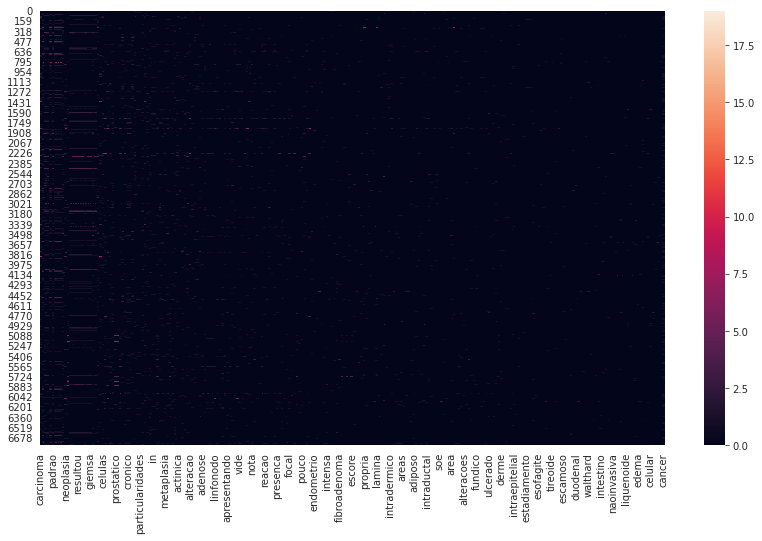

In [92]:
fig = plt.figure(figsize=(14,8))
sn.heatmap(bag_df)
plt.show()

In [93]:
# definição de TF-IDF
tfidf_df = bag_df.copy()
for col in list(bag_df.columns[0:-1]):
    tfidf_df[col] = bag_df[col]/wordfreq[col]
tfidf_df

,carcinoma,grau,mucosa,cronica,baixo,padrao,displasia,adenoma,tubular,polipo,...,medula,lipoma,tumor,medindo,celular,agudizado,diferenciada,folicular,colecistite,cancer
0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000743,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.000000,0.000000,0.000639,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002230,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.000000,0.000639,0.000000,0.000000,0.000000,0.000000,0.000000,0.001487,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6802,0.0,0.001091,0.000000,0.000000,0.001302,0.000000,0.001318,0.001341,0.001431,0.000743,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6803,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6804,0.0,0.000000,0.001124,0.001917,0.000000,0.001308,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6805,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


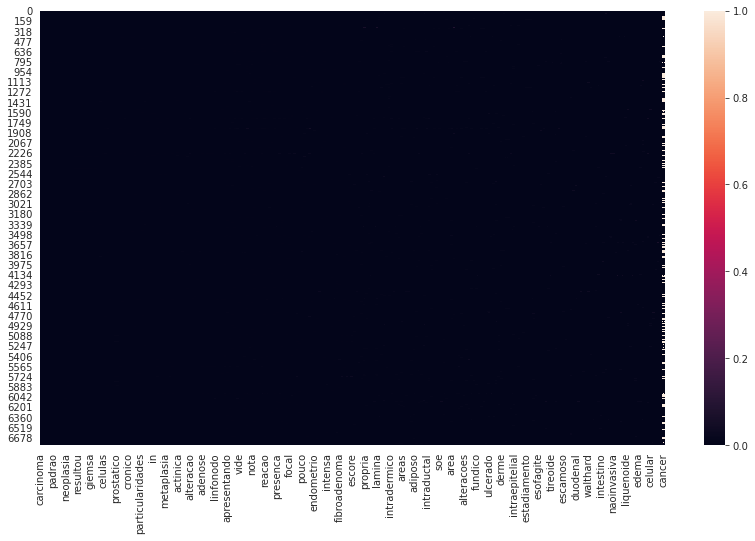

In [94]:
fig = plt.figure(figsize=(14,8))
sn.heatmap(tfidf_df)
plt.show()

# Início dos testes com modelos de classificação

Verifica-se inicialmente a acurácia de modelos de classificação (random forests) para o dataset bag_df.

* preparação dos dados
* split dos dados
* otimização de parâmetros com optuna
* treinamento do modelo 
* avaliação de métricas

## Testes com bag of words do dataset não lematizado

In [95]:
# definição de features e target - preparação 
target = 'cancer'
features = list(bag_df.columns)
if target in features:
    features.remove(target)

In [96]:
# split dos dados - 70% para treino e 30% para validação
x_train, x_test, y_train, y_test = train_test_split(
    bag_df[features], 
    bag_df[target], 
    train_size=0.7, 
    shuffle=True,
    random_state=123
    )

[I 2021-06-14 18:33:59,160] A new study created in memory with name: no-name-fab8de9c-2b42-41aa-a5d5-5a17c6c6c4c1
[I 2021-06-14 18:34:13,226] Trial 0 finished with value: 0.9520071575992075 and parameters: {'max_depth': 45, 'n_estimators': 1141, 'min_samples_split': 24, 'min_samples_leaf': 72}. Best is trial 0 with value: 0.9520071575992075.
[I 2021-06-14 18:34:15,424] Trial 1 finished with value: 0.8697389572588758 and parameters: {'max_depth': 19, 'n_estimators': 188, 'min_samples_split': 3, 'min_samples_leaf': 104}. Best is trial 0 with value: 0.9520071575992075.
[I 2021-06-14 18:34:24,792] Trial 2 finished with value: 0.8427943164158224 and parameters: {'max_depth': 73, 'n_estimators': 850, 'min_samples_split': 2, 'min_samples_leaf': 117}. Best is trial 0 with value: 0.9520071575992075.
[I 2021-06-14 18:34:28,785] Trial 3 finished with value: 0.9837546804568784 and parameters: {'max_depth': 100, 'n_estimators': 255, 'min_samples_split': 7, 'min_samples_leaf': 23}. Best is trial 3 w

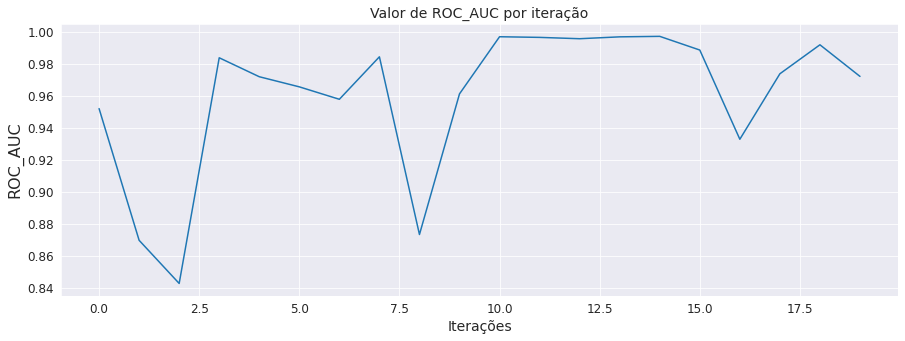

In [97]:
# otimização de parâmetros
sm_po = SupervisedModelz('random_forest', 'binary')

param_search = {
    'fixed': {
        'class_weight': 'balanced'
    },
    'search': [
        {
            'name': 'max_depth',
            'range': [1, 120],
            'type': 'integer_uniform'
        },{
            'name': 'n_estimators',
            'range': [1, 1200],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_split',
            'range': [2, 32],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_leaf',
            'range': [1, 120],
            'type': 'integer_uniform'
        }
    ]
}

model_with_optimization = sm_po.optuna_optimization(
    x_train, 
    y_train, 
    param_search, 
    'ROC_AUC', 
    splits=5, 
    trials = 20)

import plotly.io as pio
pio.renderers.default='notebook'
opr = sm_po.bayesian_optmization_report(model_with_optimization.trials_dataframe())

In [98]:
# treinamento do modelo com parâmetros otimizados
model = sm_po.fit_best_params(
    x_train, 
    x_test, 
    y_train, 
    y_test, 
    model_with_optimization
    )

fit para ROC_AUC = 0.9971 [idx = 14]
Treinando o modelo RANDOM_FOREST, objetivo BINARY... 

Modelo treinado em 0.06 minutos 



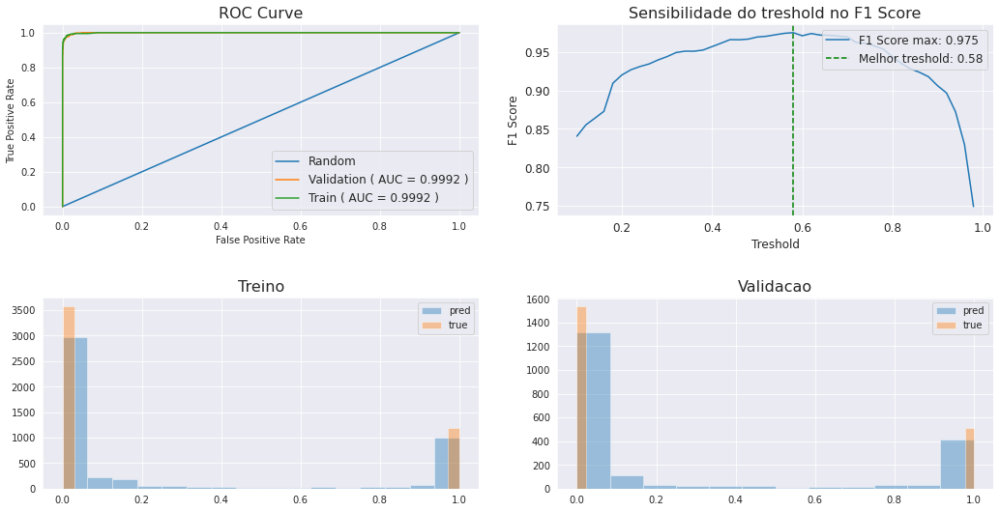

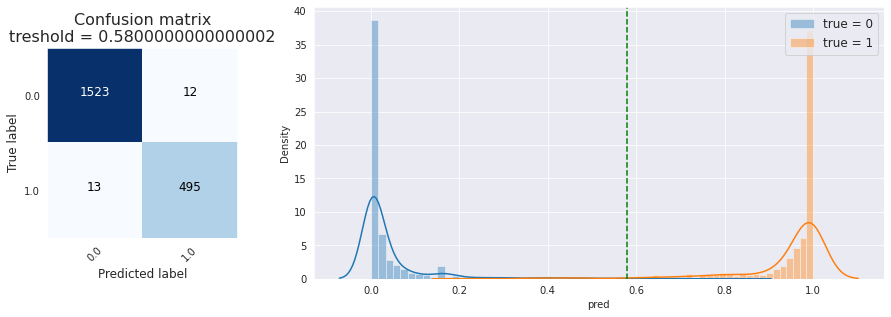


              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1535
         1.0       0.98      0.97      0.98       508

    accuracy                           0.99      2043
   macro avg       0.98      0.98      0.98      2043
weighted avg       0.99      0.99      0.99      2043



In [99]:
# avaliação de métricas
ytrain_pred = sm_po.predict(x_train)
yval_pred = sm_po.predict(x_test)

sm_po.evaluation_plots(
    y_train.values, 
    ytrain_pred, 
    y_test.values, 
    yval_pred
    )

## Testes com TF-IDF do dataset não lematizado

In [100]:
# definição de features e target - preparação 
target = 'cancer'
features = list(tfidf_df.columns)
if target in features:
    features.remove(target)

In [102]:
# split dos dados - 70% para treino e 30% para validação
x_train, x_test, y_train, y_test = train_test_split(
    tfidf_df[features], 
    tfidf_df[target], 
    train_size=0.7, 
    shuffle=True,
    random_state=123
    )

# normalization 
std_scale = StandardScaler().fit(X=x_train)
x_train = std_scale.transform(x_train)
x_test = std_scale.transform(x_test)

x_train = pd.DataFrame(x_train, columns=features)
x_test = pd.DataFrame(x_test, columns=features)

[I 2021-06-14 18:40:09,349] A new study created in memory with name: no-name-35b5867f-b42e-4ea5-90d6-2e3ea8d2889f
[I 2021-06-14 18:40:22,051] Trial 0 finished with value: 0.9520071575992075 and parameters: {'max_depth': 45, 'n_estimators': 1141, 'min_samples_split': 24, 'min_samples_leaf': 72}. Best is trial 0 with value: 0.9520071575992075.
[I 2021-06-14 18:40:24,122] Trial 1 finished with value: 0.8697389572588758 and parameters: {'max_depth': 19, 'n_estimators': 188, 'min_samples_split': 3, 'min_samples_leaf': 104}. Best is trial 0 with value: 0.9520071575992075.
[I 2021-06-14 18:40:32,969] Trial 2 finished with value: 0.8427943164158224 and parameters: {'max_depth': 73, 'n_estimators': 850, 'min_samples_split': 2, 'min_samples_leaf': 117}. Best is trial 0 with value: 0.9520071575992075.
[I 2021-06-14 18:40:36,458] Trial 3 finished with value: 0.9837546804568784 and parameters: {'max_depth': 100, 'n_estimators': 255, 'min_samples_split': 7, 'min_samples_leaf': 23}. Best is trial 3 w

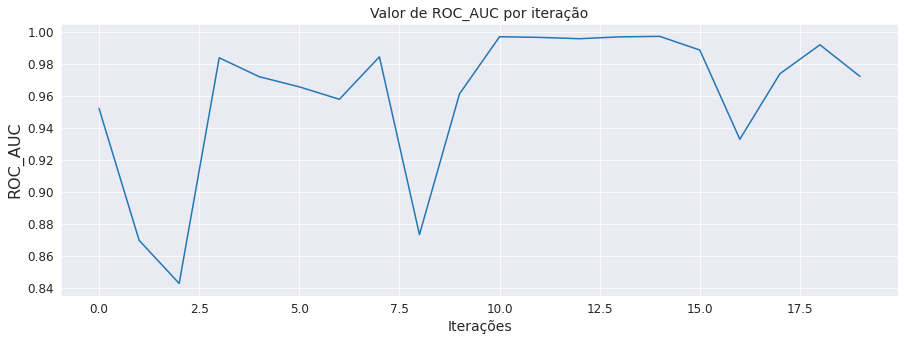

In [103]:
# otimização de parâmetros
sm_po = SupervisedModelz('random_forest', 'binary')

param_search = {
    'fixed': {
        'class_weight': 'balanced'
    },
    'search': [
        {
            'name': 'max_depth',
            'range': [1, 120],
            'type': 'integer_uniform'
        },{
            'name': 'n_estimators',
            'range': [1, 1200],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_split',
            'range': [2, 32],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_leaf',
            'range': [1, 120],
            'type': 'integer_uniform'
        }
    ]
}

model_with_optimization = sm_po.optuna_optimization(
    x_train, 
    y_train, 
    param_search, 
    'ROC_AUC', 
    splits=5, 
    trials = 20)

import plotly.io as pio
pio.renderers.default='notebook'
opr = sm_po.bayesian_optmization_report(model_with_optimization.trials_dataframe())

In [104]:
# treinamento do modelo com parâmetros otimizados
model = sm_po.fit_best_params(
    x_train, 
    x_test, 
    y_train, 
    y_test, 
    model_with_optimization
    )

fit para ROC_AUC = 0.9971 [idx = 14]
Treinando o modelo RANDOM_FOREST, objetivo BINARY... 

Modelo treinado em 0.05 minutos 



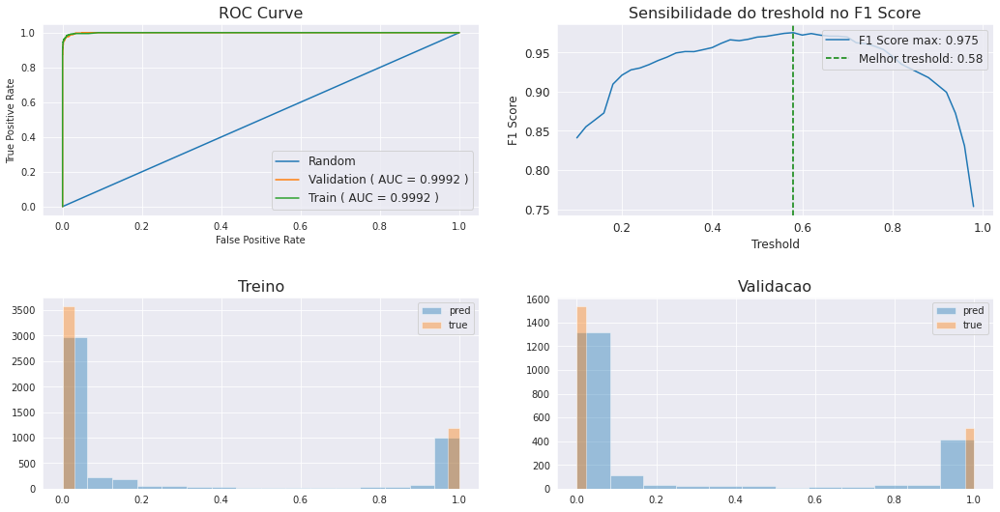

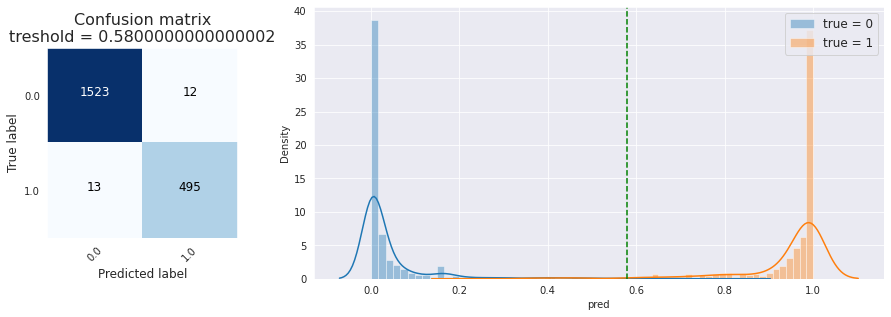


              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1535
         1.0       0.98      0.97      0.98       508

    accuracy                           0.99      2043
   macro avg       0.98      0.98      0.98      2043
weighted avg       0.99      0.99      0.99      2043



In [105]:
# avaliação de métricas
ytrain_pred = sm_po.predict(x_train)
yval_pred = sm_po.predict(x_test)

sm_po.evaluation_plots(
    y_train.values, 
    ytrain_pred, 
    y_test.values, 
    yval_pred
    )

## Modelo de classificação para o dataset lematizado

bag of words reduced from  2230 to  250


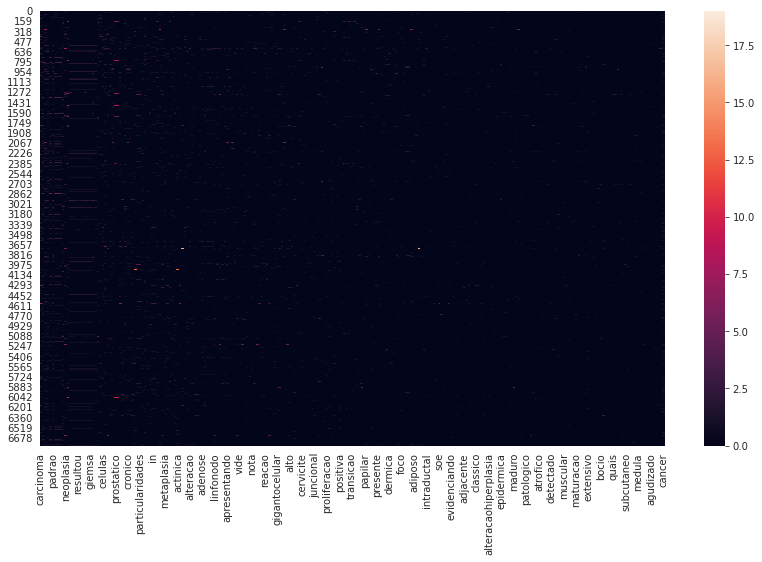

In [106]:
# lista com todos os termos não filtrados da coluna 'texto_diagnostico_resumo' - possui duplicatas
all_sentences = dataset_lem['texto_diagnostico_resumo'].sum()

# dicionário com frequências dos termos
wordfreq = {}
for word in all_sentences:
    if word not in wordfreq.keys():
        wordfreq[word] = 1
    else:
        wordfreq[word] += 1
        
# selecionando as n_entries entradas mais recorrentes no dataset
n_entries = 250
most_freq = heapq.nlargest(n_entries, wordfreq, key=wordfreq.get)
print('bag of words reduced from ', len(set(all_sentences)), 'to ', n_entries)

# matriz para armazenamento das informações de frequência absoluta - apenas para os n_entries termos mais frequentes
bag_numpy = np.zeros(shape=(len(dataset_lem['texto_diagnostico_resumo']),len(most_freq)+1))

for i in range(len(dataset_lem['texto_diagnostico_resumo'])):
    for word in dataset_lem['texto_diagnostico_resumo'].iloc[i]:
        if word in most_freq:
            bag_numpy[i,most_freq.index(word)] = bag_numpy[i,most_freq.index(word)]+1

bag_numpy[:,-1] = dataset_lem['cancer'].to_list()

# convertendo bag of words de numpy array para dataframe
bag_df = pd.DataFrame(bag_numpy, columns=most_freq+['cancer'])

fig = plt.figure(figsize=(14,8))
sn.heatmap(bag_df)
plt.show()

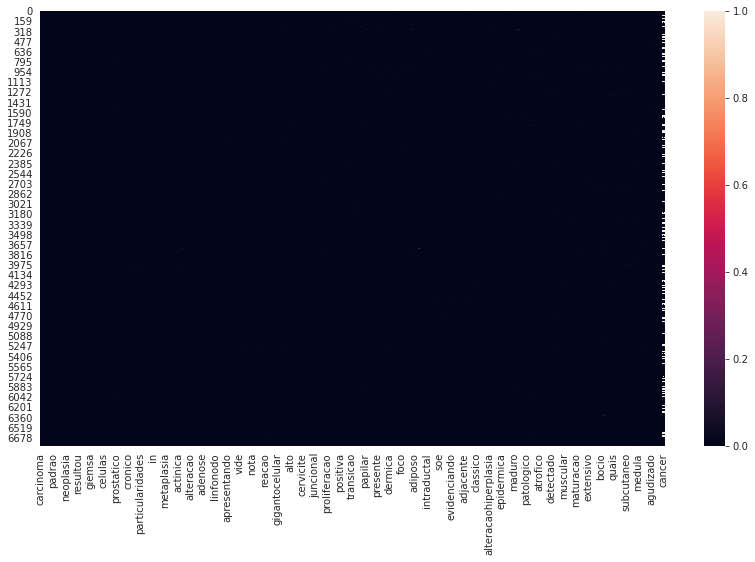

In [107]:
# definição de TF-IDF
tfidf_df = bag_df.copy()
for col in list(bag_df.columns[0:-1]):
    tfidf_df[col] = bag_df[col]/wordfreq[col]

fig = plt.figure(figsize=(14,8))
sn.heatmap(tfidf_df)
plt.show()

## Testes com bag of words do dataset lematizado

In [108]:
# definição de features e target - preparação 
target = 'cancer'
features = list(bag_df.columns)
if target in features:
    features.remove(target)

In [109]:
# split dos dados - 70% para treino e 30% para validação
x_train, x_test, y_train, y_test = train_test_split(
    bag_df[features], 
    bag_df[target], 
    train_size=0.7, 
    shuffle=True,
    random_state=123
    )

[I 2021-06-14 18:43:04,343] A new study created in memory with name: no-name-5f67c664-f09c-4a88-ab42-e98ed59913e8
[I 2021-06-14 18:43:18,126] Trial 0 finished with value: 0.9523636008793396 and parameters: {'max_depth': 45, 'n_estimators': 1141, 'min_samples_split': 24, 'min_samples_leaf': 72}. Best is trial 0 with value: 0.9523636008793396.
[I 2021-06-14 18:43:20,628] Trial 1 finished with value: 0.8697627169370732 and parameters: {'max_depth': 19, 'n_estimators': 188, 'min_samples_split': 3, 'min_samples_leaf': 104}. Best is trial 0 with value: 0.9523636008793396.
[I 2021-06-14 18:43:45,099] Trial 2 finished with value: 0.8666387427014393 and parameters: {'max_depth': 73, 'n_estimators': 850, 'min_samples_split': 2, 'min_samples_leaf': 117}. Best is trial 0 with value: 0.9523636008793396.
[I 2021-06-14 18:43:57,001] Trial 3 finished with value: 0.9839035380211325 and parameters: {'max_depth': 100, 'n_estimators': 255, 'min_samples_split': 7, 'min_samples_leaf': 23}. Best is trial 3 w

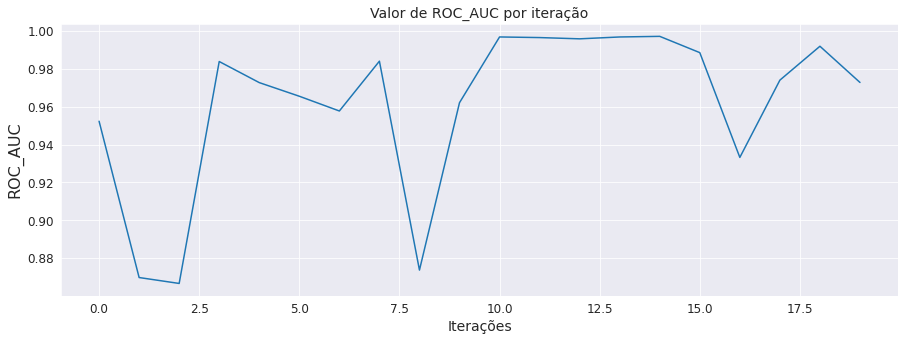

In [110]:
# otimização de parâmetros
sm_po = SupervisedModelz('random_forest', 'binary')

param_search = {
    'fixed': {
        'class_weight': 'balanced'
    },
    'search': [
        {
            'name': 'max_depth',
            'range': [1, 120],
            'type': 'integer_uniform'
        },{
            'name': 'n_estimators',
            'range': [1, 1200],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_split',
            'range': [2, 32],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_leaf',
            'range': [1, 120],
            'type': 'integer_uniform'
        }
    ]
}

model_with_optimization = sm_po.optuna_optimization(
    x_train, 
    y_train, 
    param_search, 
    'ROC_AUC', 
    splits=5, 
    trials = 20)

import plotly.io as pio
pio.renderers.default='notebook'
opr = sm_po.bayesian_optmization_report(model_with_optimization.trials_dataframe())

In [111]:
# treinamento do modelo com parâmetros otimizados
model = sm_po.fit_best_params(
    x_train, 
    x_test, 
    y_train, 
    y_test, 
    model_with_optimization
    )

fit para ROC_AUC = 0.9972 [idx = 14]
Treinando o modelo RANDOM_FOREST, objetivo BINARY... 

Modelo treinado em 0.22 minutos 



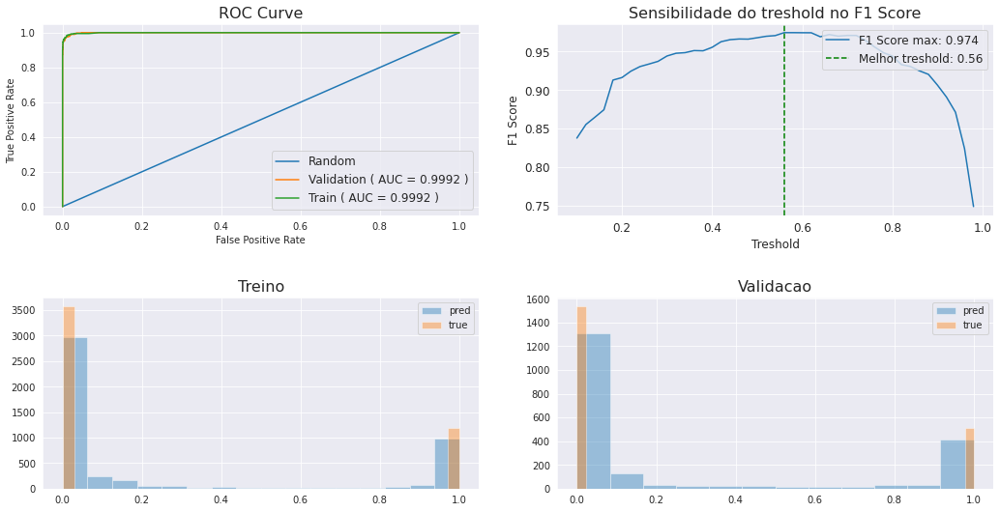

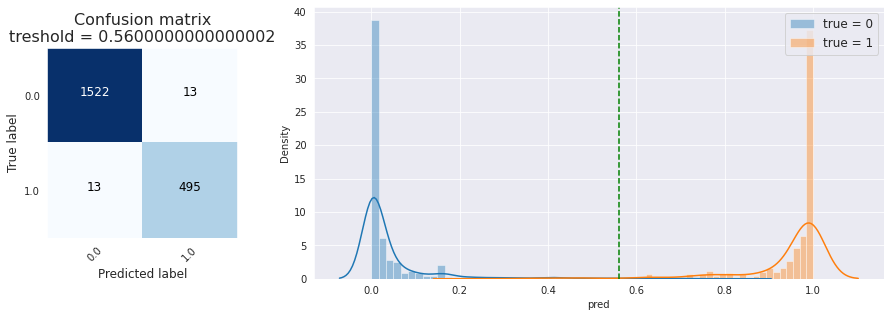


              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1535
         1.0       0.97      0.97      0.97       508

    accuracy                           0.99      2043
   macro avg       0.98      0.98      0.98      2043
weighted avg       0.99      0.99      0.99      2043



In [112]:
# avaliação de métricas
ytrain_pred = sm_po.predict(x_train)
yval_pred = sm_po.predict(x_test)

sm_po.evaluation_plots(
    y_train.values, 
    ytrain_pred, 
    y_test.values, 
    yval_pred
    )

## Testes com TF-IDF do dataset lematizado

In [114]:
# definição de features e target - preparação 
target = 'cancer'
features = list(tfidf_df.columns)
if target in features:
    features.remove(target)

In [115]:
# split dos dados - 70% para treino e 30% para validação
x_train, x_test, y_train, y_test = train_test_split(
    tfidf_df[features], 
    tfidf_df[target], 
    train_size=0.7, 
    shuffle=True,
    random_state=123
    )

# normalization 
std_scale = StandardScaler().fit(X=x_train)
x_train = std_scale.transform(x_train)
x_test = std_scale.transform(x_test)

x_train = pd.DataFrame(x_train, columns=features)
x_test = pd.DataFrame(x_test, columns=features)

[I 2021-06-14 18:48:41,720] A new study created in memory with name: no-name-cdf1750e-39af-4510-9875-54711338a40c
[I 2021-06-14 18:49:19,422] Trial 0 finished with value: 0.9523636008793396 and parameters: {'max_depth': 45, 'n_estimators': 1141, 'min_samples_split': 24, 'min_samples_leaf': 72}. Best is trial 0 with value: 0.9523636008793396.
[I 2021-06-14 18:49:25,236] Trial 1 finished with value: 0.8697627169370732 and parameters: {'max_depth': 19, 'n_estimators': 188, 'min_samples_split': 3, 'min_samples_leaf': 104}. Best is trial 0 with value: 0.9523636008793396.
[I 2021-06-14 18:49:54,735] Trial 2 finished with value: 0.8666387427014393 and parameters: {'max_depth': 73, 'n_estimators': 850, 'min_samples_split': 2, 'min_samples_leaf': 117}. Best is trial 0 with value: 0.9523636008793396.
[I 2021-06-14 18:50:05,093] Trial 3 finished with value: 0.9839035380211325 and parameters: {'max_depth': 100, 'n_estimators': 255, 'min_samples_split': 7, 'min_samples_leaf': 23}. Best is trial 3 w

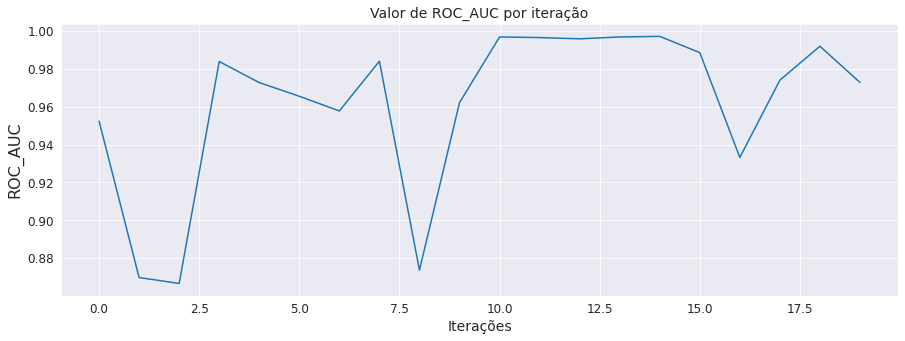

In [116]:
# otimização de parâmetros
sm_po = SupervisedModelz('random_forest', 'binary')

param_search = {
    'fixed': {
        'class_weight': 'balanced'
    },
    'search': [
        {
            'name': 'max_depth',
            'range': [1, 120],
            'type': 'integer_uniform'
        },{
            'name': 'n_estimators',
            'range': [1, 1200],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_split',
            'range': [2, 32],
            'type': 'integer_uniform'
        },{
            'name': 'min_samples_leaf',
            'range': [1, 120],
            'type': 'integer_uniform'
        }
    ]
}

model_with_optimization = sm_po.optuna_optimization(
    x_train, 
    y_train, 
    param_search, 
    'ROC_AUC', 
    splits=5, 
    trials = 20)

import plotly.io as pio
pio.renderers.default='notebook'
opr = sm_po.bayesian_optmization_report(model_with_optimization.trials_dataframe())

In [117]:
# treinamento do modelo com parâmetros otimizados
model = sm_po.fit_best_params(
    x_train, 
    x_test, 
    y_train, 
    y_test, 
    model_with_optimization
    )

fit para ROC_AUC = 0.9972 [idx = 14]
Treinando o modelo RANDOM_FOREST, objetivo BINARY... 

Modelo treinado em 0.18 minutos 



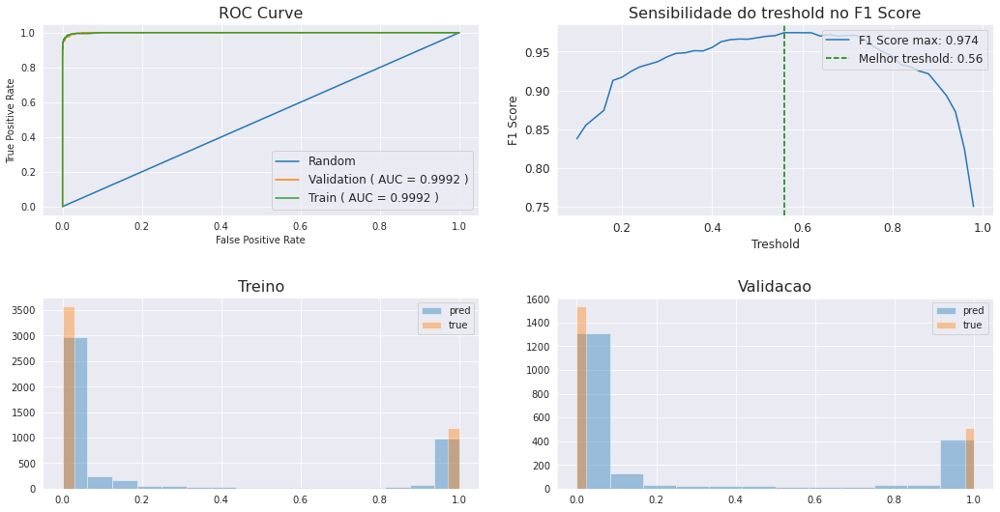

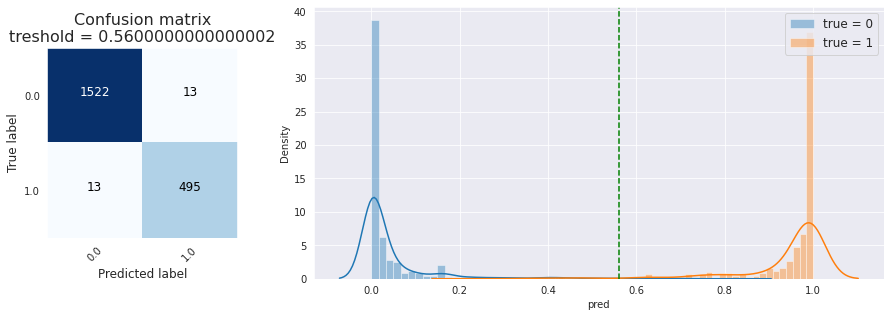


              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1535
         1.0       0.97      0.97      0.97       508

    accuracy                           0.99      2043
   macro avg       0.98      0.98      0.98      2043
weighted avg       0.99      0.99      0.99      2043



In [118]:
# avaliação de métricas
ytrain_pred = sm_po.predict(x_train)
yval_pred = sm_po.predict(x_test)

sm_po.evaluation_plots(
    y_train.values, 
    ytrain_pred, 
    y_test.values, 
    yval_pred
    )

## Conclusões iniciais

Resultados satisfatórios foram obtidos com todas as variações de modelos de classificação produzidos. O modelo otimizado para o bag of words do dataset não lematizado foi aquele apresentou os melhores resultados (f1-score=0.98, acc=0.99). Para tal modelo, foram verificados 1523 verdadeiros negativos, 495 verdadeiros negativos, 12 falsos positivos e 13 falsos negativos.